-----------------------
#### Mapping Existing Gentrification Indices
We sought out existing projects and research that has been done. We came across the Urban Displacement Project (UDP), a UCLA and UC Berkeley joint effort to typologize and define gentrification, cataloging its past and current occurences, as well as predicting its future sites. UDP used change in income, rent, and college educated demographics to assess gentrification. I took week 4 to play around with this data.

In [1]:
# import libraries
import pandas as pd
import numpy as np
import libpysal as lp
import geopandas as gpd
import plotly as pl
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import contextily as ctx
import json
import seaborn as sns
import plotly.offline as pyo

# To ignore warnings
import warnings
warnings.filterwarnings('ignore')

##### I. Read in
Here we will pull in data from an existing gentrification index created by the UDP team, beginning in 2016. This will allow us to test analyses and operations. We are aiming to create a similar typology through our own index, whose inputs we have started to explore.


In [2]:
# read in genetrification typology from Urban Displacement Project
g_type = pd.read_csv('data/typology_LA.csv',
                     sep =";",
                     dtype = {'FIPS':str})

## census tracts from 2020
tracts = gpd.read_file('data/Census_Tracts_2020.geojson')

# import LA neighborhoods from ArcGIS
nbh = gpd.read_file("https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson")

We are aligning FIPS syntax across datasets for simple merging later. These are mostly correcting for leading zeros and data type issues.

In [3]:
# Gentrification typology
g_type['FIPS'] = g_type['FIPS'].str.zfill(11)

# census tracts
tracts = tracts[['CT20','geometry']]
tracts['FIPS'] ='06' + '037' + tracts['CT20']
tracts = tracts[['FIPS','geometry']]


##### II. Make typology map, and then merge
We wanted to recreate the map that UDP produced for LA. This sets the stage for how we take this information at the census level and later draw conclusions about neighborhoods at risk of gentrifying. 

First we merge the UDP typology by FIPS code with the census tracts. Then we select for the tracts that UDP deemed at risk of or experiencing gentrification.

In [4]:
## add typology to census tracts that were at risk 
ct_typo_g = tracts.merge(g_type, on='FIPS')
ct_typo_g.head()

,FIPS,geometry,G_Typology
0,06037101110,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",Low-Income/Susceptible to Displacement
1,06037101122,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",Stable/Advanced Exclusive
2,06037101220,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",Low-Income/Susceptible to Displacement
3,06037101300,"POLYGON ((-118.26530 34.25735, -118.26530 34.2...",Stable Moderate/Mixed Income
4,06037101400,"POLYGON ((-118.29657 34.25356, -118.29694 34.2...",At Risk of Becoming Exclusive


In [5]:
def most_risk(df):
    df_temp = df[(df['G_Typology']=='Advanced Gentrification') | 
                     (df['G_Typology']=='At Risk of Gentrification') | 
                     (df['G_Typology']=='Early/Ongoing Gentrification')]
    return df_temp
ct_typo_g = most_risk(ct_typo_g)
ct_typo_g = ct_typo_g[['FIPS','geometry']]

Choropleth Mapbox, the python toolkit enabling us to make the map, requires the polygons to be in geojson format so make that conversion and then map the typology.

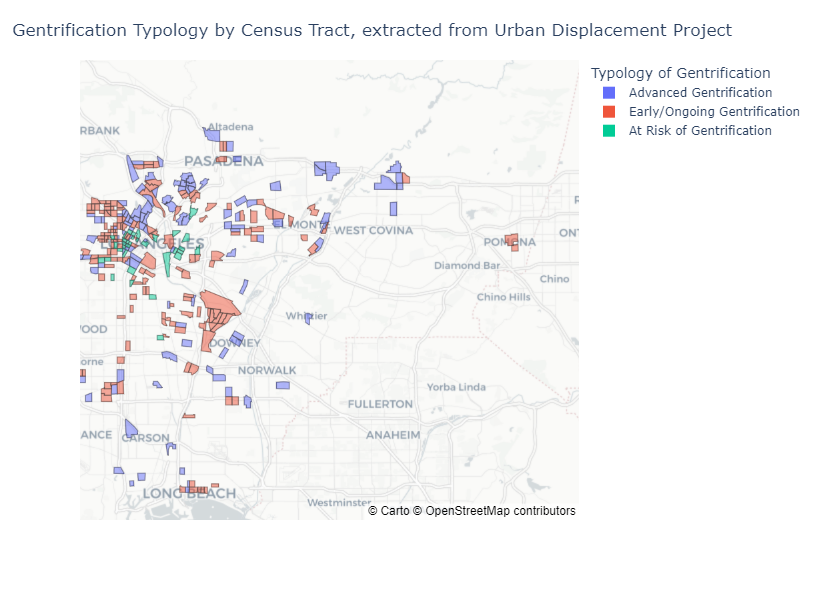

In [6]:
## create geojson file of typology tracts and rewrite it as dictionary to use in plotly mapbox function
ct_typo_g.to_file('data/Gent_tracts.geojson', driver='GeoJSON')
with open('data/Gent_tracts.geojson', 'r') as fp:
    jdata = json.load(fp)
## recreate unique identifier for the plotly mapbox function
for k in range(len(jdata['features'])):
    jdata['features'][k]['id'] = k
    
# Approximate gentrification typology map
g_type_temp = most_risk(g_type)

g_type_temp['Typology of Gentrification'] = g_type_temp['G_Typology'] 
fig = px.choropleth_mapbox(g_type_temp, geojson=jdata, color="Typology of Gentrification",
                           locations=g_type_temp['FIPS'], featureidkey="properties.FIPS",
                           center={"lat": 34, "lon": -118},
                           mapbox_style="carto-positron", zoom=9,
                          opacity=.5)
fig.update_layout(
    width = 800,
    height = 600,
    title = "Gentrification Typology by Census Tract, extracted from Urban Displacement Project",
    title_y=.96,
    title_x=0.455,
) 

fig.show()

At a quick glance, we notice the spatial concentration of gentrification in the center of the city, away from the coast and not especially inland.